# Clasificación de los hogares pobres en Costa Rica, según su grado de severidad de la pobreza 

Proyecto Machine Learning 1 

## Librerías

In [1]:
# Importar librerias
# Paquetes básicos

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Paquetes para modelos




## Importar datos y selección de variables

In [2]:
# Cargar resultado encuesta (filas: 31963, columnas: 595)
df_completo=pd.read_spss('ENAHO 2021.sav')

In [3]:
# Seleccionar campos de interés para el modelo

campos_seleccionados = ['ZONA','V7A','V7B','V7C', 'V10', 'V11', 'V12', 'V13A', 'V13B', 'V17A','V18F','V18G', 'V19',
                        'CalViv','HacDor','TamViv',
                        'NivInst', 'IPM_E1', 'IPM_E2', 'IPM_E3', 'IPM_E4',
                        'IPM_VUI1', 'IPM_VUI2', 'IPM_VUI3','IPM_VUI4',
                        'IPM_S1', 'IPM_S2', 'IPM_S3', 'IPM_S4',
                        'IPM_T1', 'IPM_T2.1', 'IPM_T2.2', 'IPM_T3',
                        'IPM_PS1', 'IPM_PS2', 'IPM_PS3', 'IPM_PS4',
                        'D_IPCN', 'ithn', 'ttmh', 'tnmh',
                        'A4', 'A5','A8A', 'A9A', 'A10A', 'A11', 'A13',
                        'cba',
                        'np', 'IPM_Pobreza'
                       ]

df =df_completo[campos_seleccionados]
#datos_nan = df_modelo.isna().sum()
#datos_nan = datos_nan[datos_nan != 0]
df = df.dropna()
df.shape

(31827, 51)

In [4]:
df = df.rename(columns={'ZONA': 'Zona',
                          'V7A': 'Est Paredes exterior',
                          'V7B': 'Est techo',
                          'V7C': 'Est piso',
                          'CalViv': 'Calificación vivienda',
                          'HacDor': 'Hacinamiento',
                          'V10': 'Mts2 vivienda',
                          'V11': 'Abastecimiento agua',
                          'V12': 'Fuente agua',
                          'V13A': 'Servicio sanitario',
                          'V13B': 'Exclusividad  Serv sanitario',
                          'V17A': 'Sistema eliminación basura',
                          'V18F': 'Tiene computador portátil',
                          'V18G': 'Tiene computador escritorio',
                          'TamViv': 'Personas en vivienda',
                          'A4': 'Sexo',
                          'V19': 'Tiene internet',
                          'A5': 'Edad',
                          'NivInst': 'Nivel de instrucción',
                          'IPM_E1': 'E1 No educación formal',
                          'IPM_E2': 'E2 Rezago educativo',
                          'IPM_E3': 'E3 Sin bachillerato',
                          'IPM_E4': 'E4 Bajo desarrollo',
                          'IPM_VUI1': 'VUI1 Mal Est techo piso',
                          'IPM_VUI2': 'VUI2 Mal Est paredes ext',
                          'IPM_VUI3': 'VUI3 Hacinamiento',
                          'IPM_VUI4': 'VUI3 Sin uso internet',
                          'IPM_S1': 'S1 Sin seguro salud',
                          'IPM_S2': 'S2 Sin servicio agua',
                          'IPM_S3': 'S3 Sin eliminación excretas',
                          'IPM_S4': 'S4 Sin eliminacion basura',
                          'IPM_T1': 'T1 Desempleo larga duracion',
                          'IPM_T2.1': 'T2 Incumplim Salario Mínimo',
                          'IPM_T2.2': 'T2 Incumplim otros derechos',
                          'IPM_T3': 'T3 Independiente informal',
                          'IPM_PS1': 'PS1 Infancia sin cuido',
                          'IPM_PS2': 'PS2 Adulto mayor sin pension',
                          'IPM_PS3': 'PS3 Con Discapacidad sin transf.',
                          'IPM_PS4': 'PS4 No labora obligación familiar',
                          'ttmh': 'Total Transf Monetaria Hogar',
                          'D_IPCN': 'Decil ingreso per cápita hogar',
                          'ithn': 'Ingreso neto hogar',
                          'tnmh': 'Transf no monetaria hogar',
                          'A8A': 'Primera mencion discapacidad',
                          'A9A': 'Recibió ayuda IMAS',
                          'A11': 'Condicion aseguramiento',
                          'A13': 'Asistencia a educación formal',
                          'A10A': 'Primera mencion Cen-Cinai',
                          'cba': 'Canasta Básica Alimentaria',
                          'np': 'Nivel de pobreza',
                          'IPM_Pobreza': 'Índice Pobreza Multidim'})

df.head(3)

,Zona,Est Paredes exterior,Est techo,Est piso,Mts2 vivienda,Abastecimiento agua,Fuente agua,Servicio sanitario,Exclusividad Serv sanitario,Sistema eliminación basura,...,Sexo,Edad,Primera mencion discapacidad,Recibió ayuda IMAS,Primera mencion Cen-Cinai,Condicion aseguramiento,Asistencia a educación formal,Canasta Básica Alimentaria,Nivel de pobreza,Índice Pobreza Multidim
0,Urbana,Bueno,Regular,Regular,De 61m² a 100m²,Tubería dentro de la vivienda,Acueducto del A y A,Conectado a alcantarilla o cloaca,Sólo para esta vivienda,Camión recolector,...,Mujer,49.0,No tiene ninguna,No ha recibido,No ha recibido,Voluntario,No asiste,51307.0,No pobre,No pobre multidimensional
1,Urbana,Bueno,Regular,Regular,De 61m² a 100m²,Tubería dentro de la vivienda,Acueducto del A y A,Conectado a alcantarilla o cloaca,Sólo para esta vivienda,Camión recolector,...,Hombre,59.0,Caminar o subir gradas,No ha recibido,No ha recibido,Pensionado del régimen de IVM de la CCSS,No asiste,51307.0,No pobre,No pobre multidimensional
2,Urbana,Bueno,Regular,Regular,De 61m² a 100m²,Tubería dentro de la vivienda,Acueducto del A y A,Conectado a alcantarilla o cloaca,Sólo para esta vivienda,Camión recolector,...,Mujer,27.0,No tiene ninguna,No ha recibido,No ha recibido,Asalariado,No asiste,51307.0,No pobre,No pobre multidimensional


In [5]:
# Cambiar formato datos Edad
df['Edad'] = df['Edad'].astype(str)
df.loc[df["Edad"] == '97 años o más', "Edad"] = 97
df.loc[df["Edad"] == 'Menos de 1 año', "Edad"] = 0
df['Edad'] = df['Edad'].astype(float)

# Identificar variables categóricas y numéricas
vars_categoricas = df.select_dtypes(include=['category']).columns
vars_numericas = df.select_dtypes(include=['float64']).columns

## Estadísticas descriptivas de variables seleccionadas

In [6]:
df[vars_categoricas].nunique()

Zona                                  2
Est Paredes exterior                  3
Est techo                             3
Est piso                              3
Mts2 vivienda                         7
Abastecimiento agua                   4
Fuente agua                           7
Servicio sanitario                    5
Exclusividad  Serv sanitario          2
Sistema eliminación basura            6
Tiene computador portátil             2
Tiene computador escritorio           2
Tiene internet                        2
Calificación vivienda                 4
Hacinamiento                          2
Nivel de instrucción                 10
E1 No educación formal                2
E2 Rezago educativo                   2
E3 Sin bachillerato                   2
E4 Bajo desarrollo                    2
VUI1 Mal Est techo piso               2
VUI2 Mal Est paredes ext              2
VUI3 Hacinamiento                     2
VUI3 Sin uso internet                 2
S1 Sin seguro salud                   2


In [7]:
vars_numericas

Index(['Personas en vivienda', 'Ingreso neto hogar',
       'Total Transf Monetaria Hogar', 'Transf no monetaria hogar', 'Edad',
       'Canasta Básica Alimentaria'],
      dtype='object')

In [8]:
df.describe()

,Personas en vivienda,Ingreso neto hogar,Total Transf Monetaria Hogar,Transf no monetaria hogar,Edad,Canasta Básica Alimentaria
count,31827.000000,3.182700e+04,3.182700e+04,31827.000000,31827.000000,31827.000000
mean,3.930122,1.013707e+06,1.370281e+05,3245.306919,36.573255,48598.902724
std,1.781404,1.214323e+06,3.085827e+05,23469.748992,21.970103,3938.553688
min,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,42871.000000
25%,3.000000,3.640000e+05,0.000000e+00,0.000000,18.000000,42871.000000
50%,4.000000,6.567760e+05,3.000000e+04,0.000000,35.000000,51307.000000
75%,5.000000,1.242692e+06,1.500000e+05,0.000000,54.000000,51307.000000
max,17.000000,4.283500e+07,9.262800e+06,962000.000000,97.000000,51307.000000


In [37]:
# Funcion para analisis de los datos

def null_exploration(df):
    
    print(df.isnull().sum())
    print(df.isnull().mean())

# Funcion para explorar las caracteristicas de los DataFrames
def describe_exploration(df):
    
    s=df.shape
    t=df.dtypes
    d=df.describe()
    d_o=df.describe(include='category')
    
    return s, t, d, d_o
    
    
# Matriz de correlacion
def corr_matrix(df, column_names):
    corr = df[column_names].corr()
    plt.figure(figsize=(30,20))

    sns.heatmap(corr,
                xticklabels=corr.columns.values,
                yticklabels=corr.columns.values,annot=True)

    corr

# Explorando los datos de cada columna
def columns_exploration(df,column_name):
    print(df[column_name].value_counts())




In [35]:
null_exploration(df)

Zona                                 0
Est Paredes exterior                 0
Est techo                            0
Est piso                             0
Mts2 vivienda                        0
Abastecimiento agua                  0
Fuente agua                          0
Servicio sanitario                   0
Exclusividad  Serv sanitario         0
Sistema eliminación basura           0
Tiene computador portátil            0
Tiene computador escritorio          0
Tiene internet                       0
Calificación vivienda                0
Hacinamiento                         0
Personas en vivienda                 0
Nivel de instrucción                 0
E1 No educación formal               0
E2 Rezago educativo                  0
E3 Sin bachillerato                  0
E4 Bajo desarrollo                   0
VUI1 Mal Est techo piso              0
VUI2 Mal Est paredes ext             0
VUI3 Hacinamiento                    0
VUI3 Sin uso internet                0
S1 Sin seguro salud      

In [38]:
describe_exploration(df)

((31827, 51),
 Zona                                 category
 Est Paredes exterior                 category
 Est techo                            category
 Est piso                             category
 Mts2 vivienda                        category
 Abastecimiento agua                  category
 Fuente agua                          category
 Servicio sanitario                   category
 Exclusividad  Serv sanitario         category
 Sistema eliminación basura           category
 Tiene computador portátil            category
 Tiene computador escritorio          category
 Tiene internet                       category
 Calificación vivienda                category
 Hacinamiento                         category
 Personas en vivienda                  float64
 Nivel de instrucción                 category
 E1 No educación formal               category
 E2 Rezago educativo                  category
 E3 Sin bachillerato                  category
 E4 Bajo desarrollo                   category

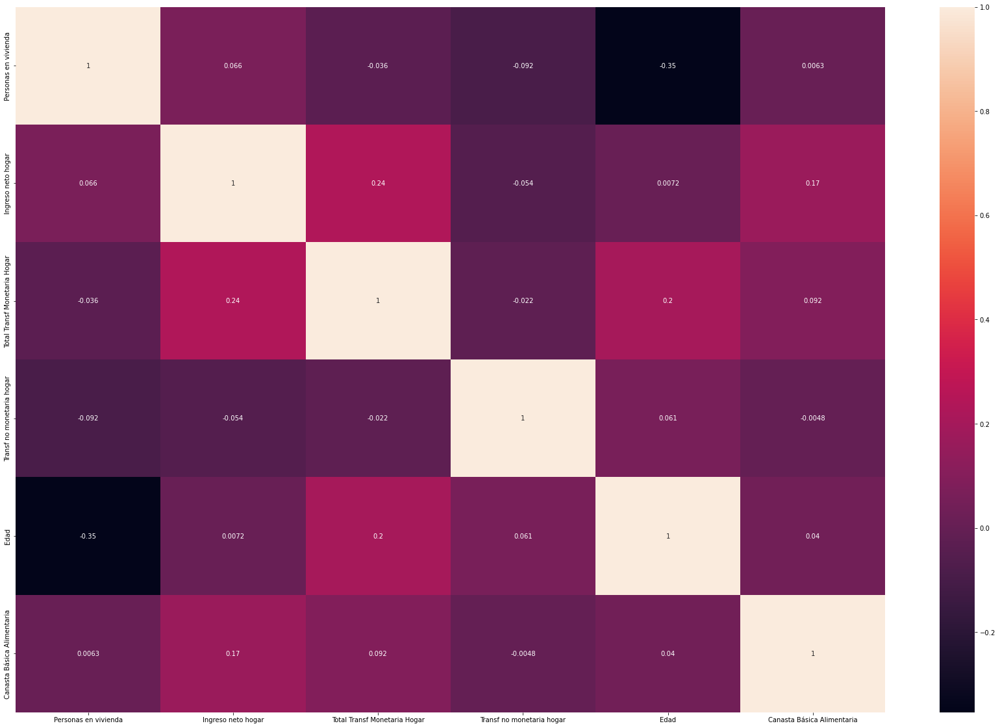

In [12]:
corr_matrix(df, df.columns.tolist())

In [13]:
for i in df.columns.tolist():
    columns_exploration(df, i)

Urbana    21610
Rural     10217
Name: Zona, dtype: int64
Bueno      17421
Regular    11190
Malo        3216
Name: Est Paredes exterior, dtype: int64
Bueno      17179
Regular    10584
Malo        4064
Name: Est techo, dtype: int64
Bueno      19045
Regular     9650
Malo        3132
Name: Est piso, dtype: int64
De 41m² a 60m²      10756
De 61m² a 100m²      9584
De 101m² a 150m²     4577
De 30m² a 40m²       2884
De 151m² a 200m²     1939
Más de 200m²         1413
Menos de 30m²         674
Name: Mts2 vivienda, dtype: int64
Tubería dentro de la vivienda                                   31063
Tubería fuera de la vivienda pero dentro del lote o edificio      616
No tiene por tubería                                               94
Tubería fuera del lote o edificio                                  54
Name: Abastecimiento agua, dtype: int64
Acueducto del A y A         16879
Acueducto rural              7681
Acueducto municipal          4283
Empresa o cooperativa        1422
Pozo              

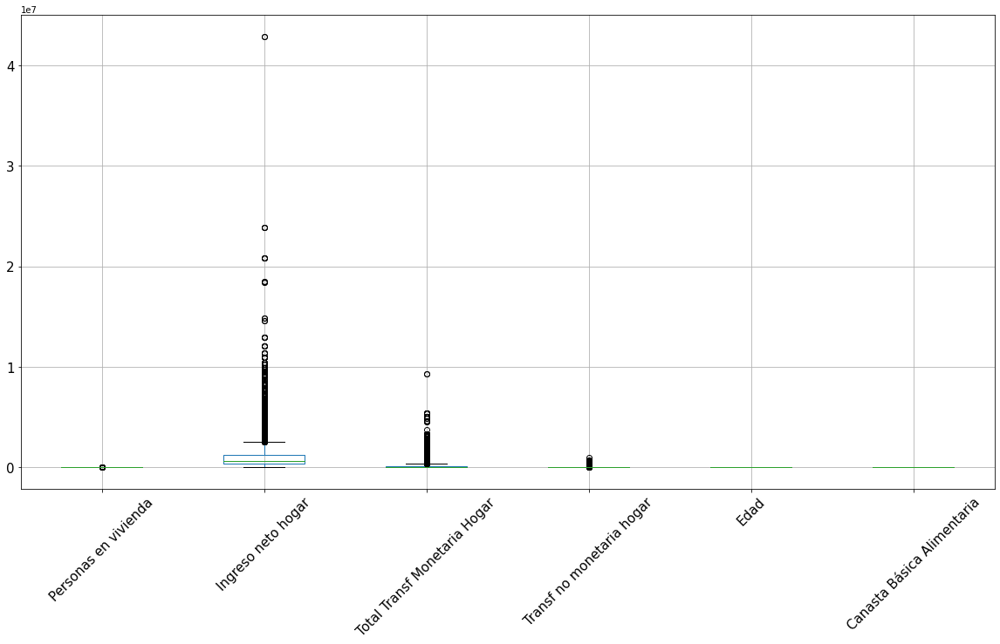

In [14]:
plt.figure(figsize=(20, 10)) 
df.boxplot(grid=True, rot=45, fontsize=15)
# 
plt.show()

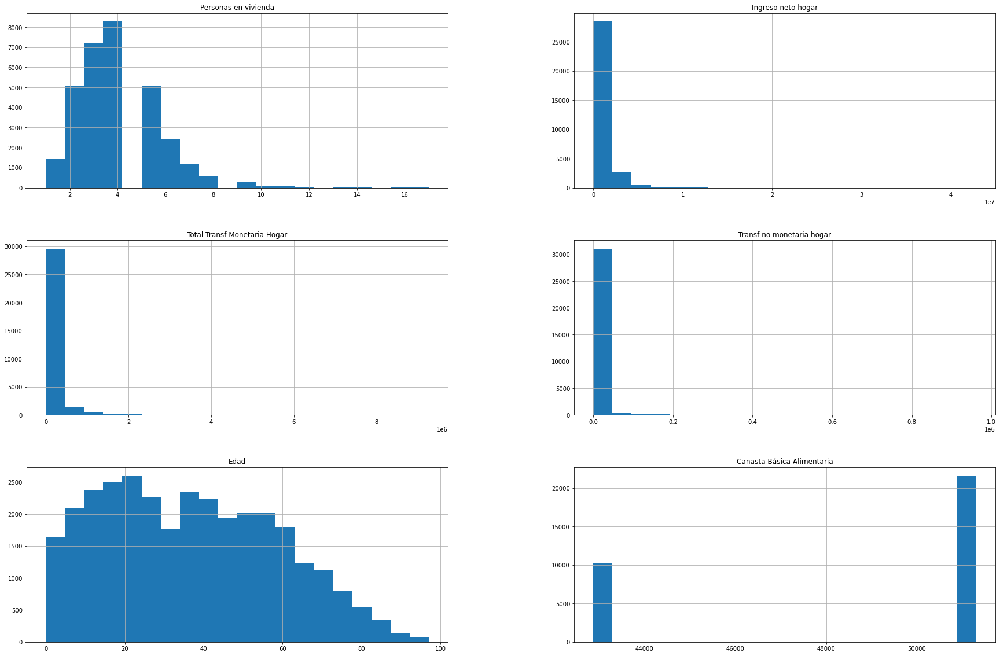

In [15]:
df.hist(bins=20,figsize=(30, 20))

plt.show()

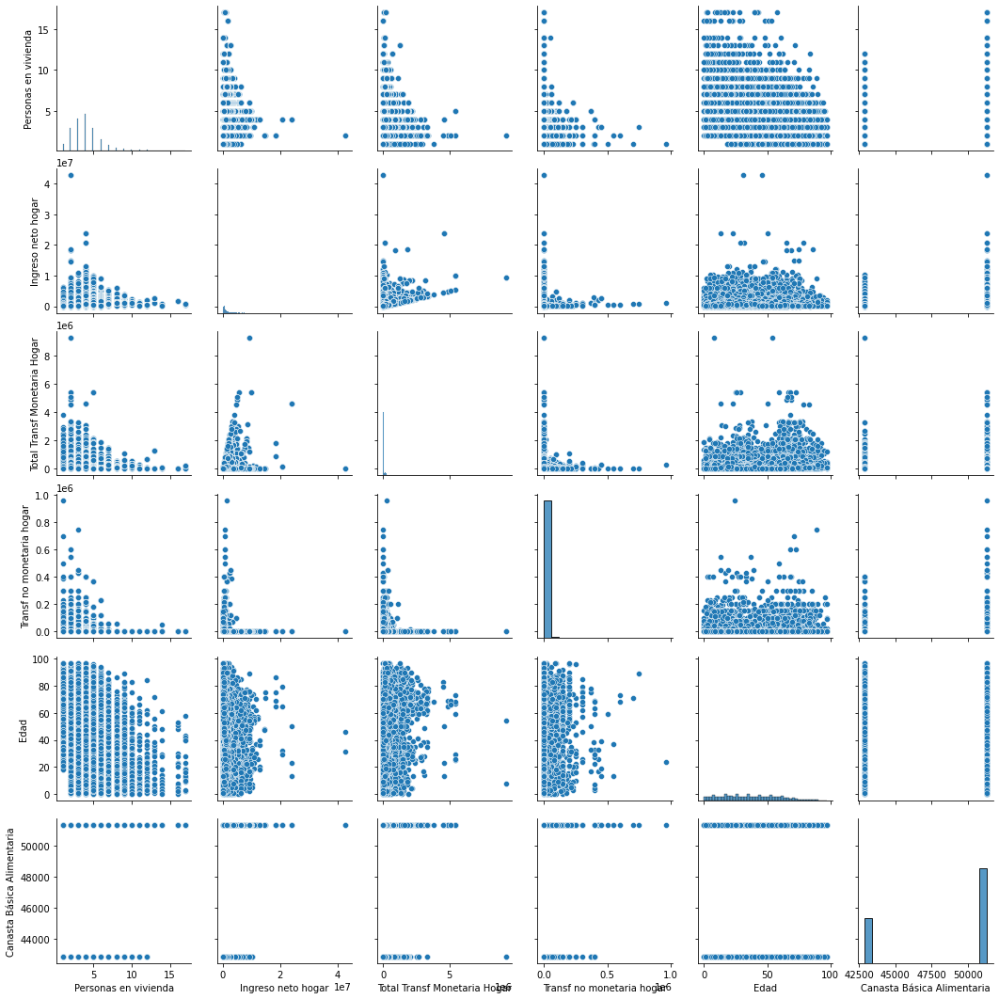

In [16]:
sns.pairplot(df, kind="scatter")
plt.show()

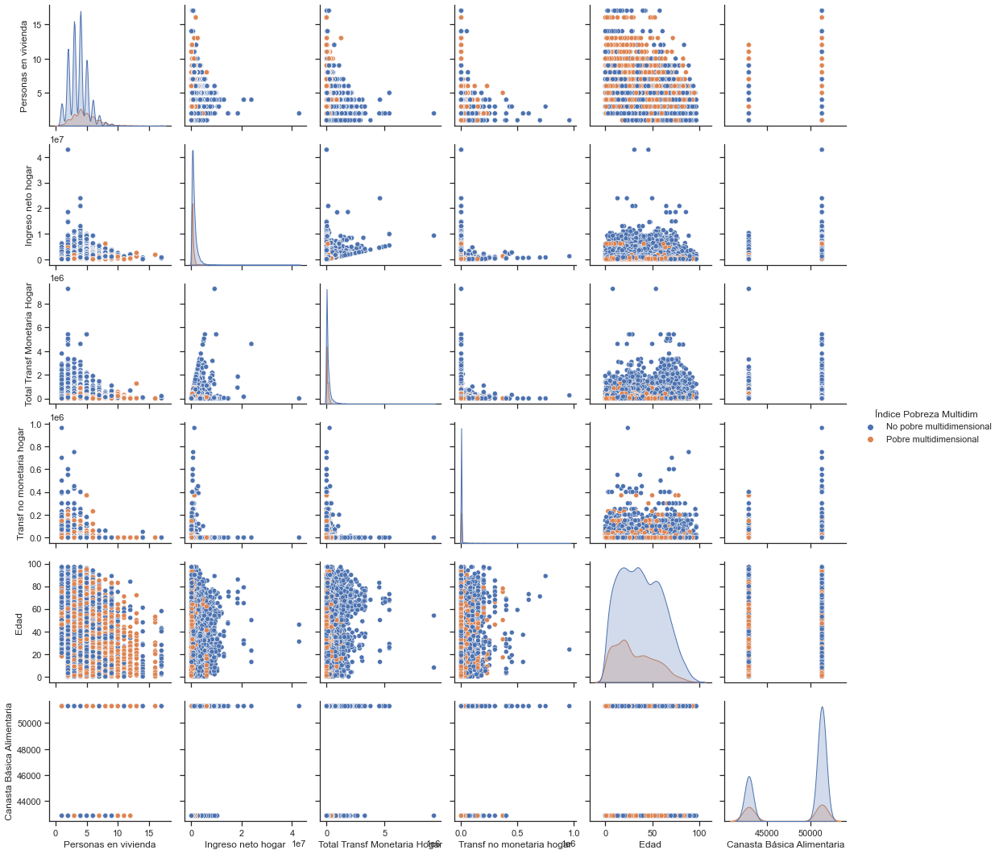

In [17]:
sns.set_theme(style="ticks")


sns.pairplot(df, hue='Índice Pobreza Multidim')

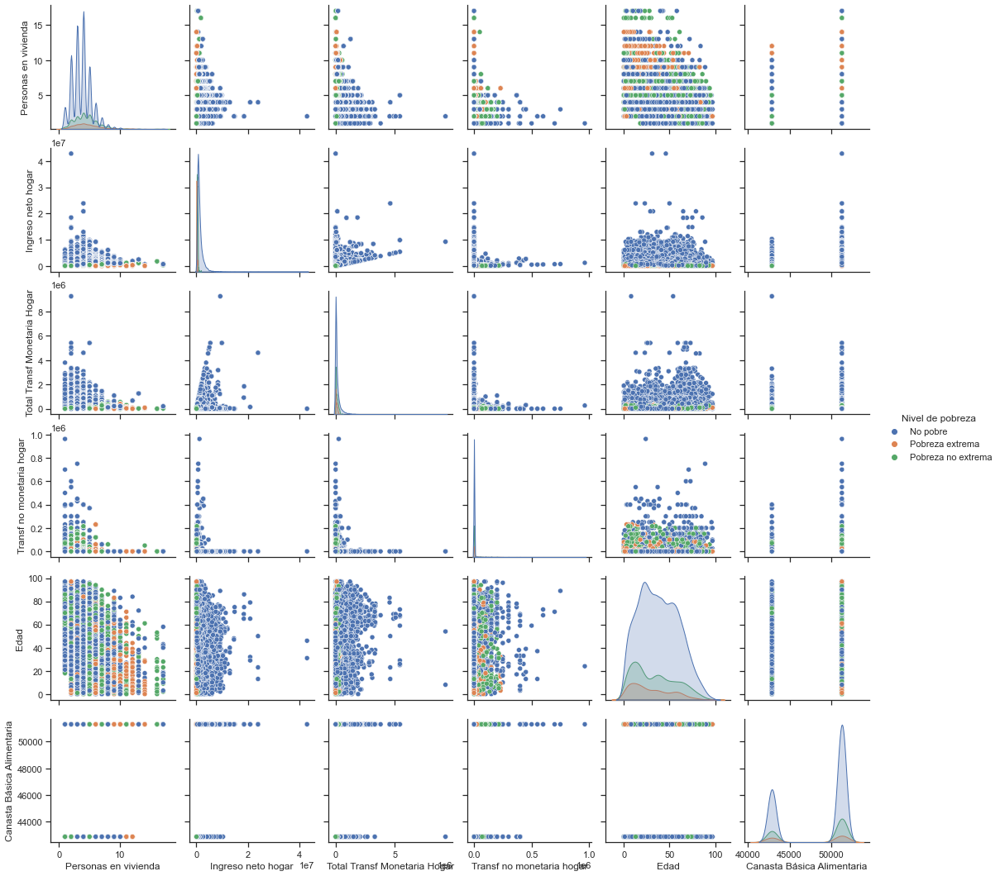

In [18]:
sns.set_theme(style="ticks")


sns.pairplot(df, hue='Nivel de pobreza')

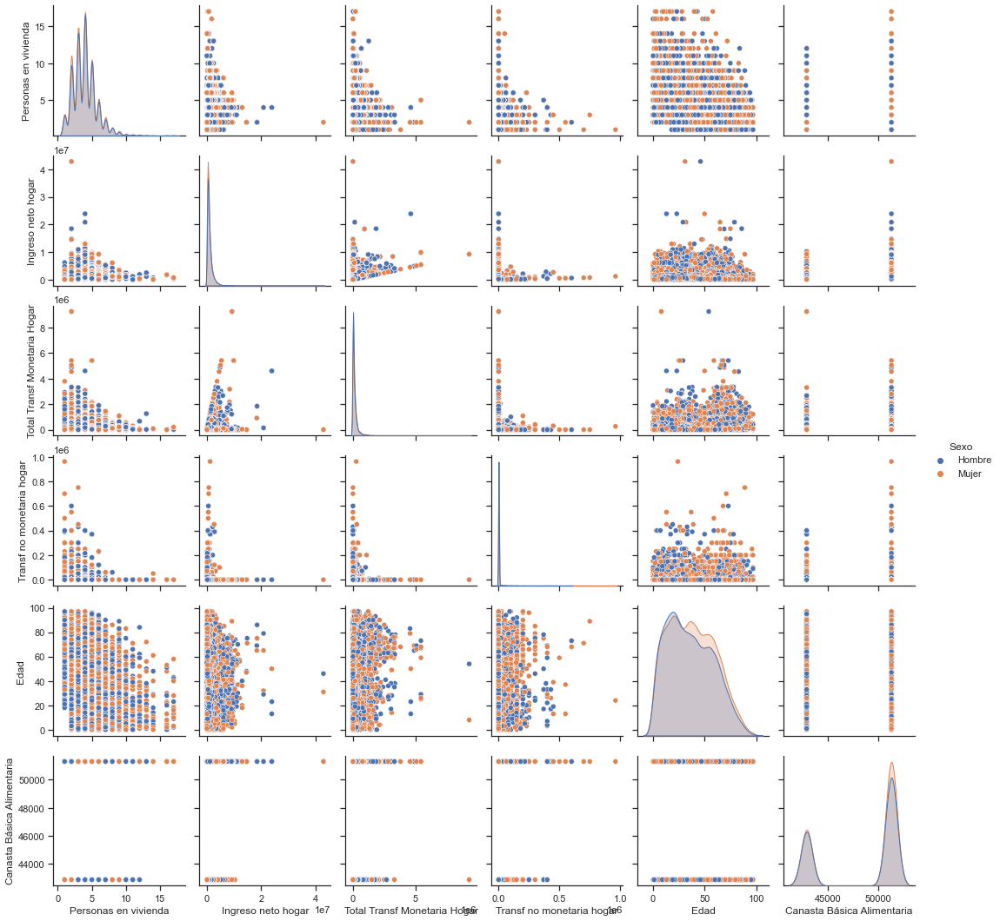

In [19]:
sns.set_theme(style="ticks")


sns.pairplot(df, hue='Sexo')



C:\Users\Jelb7\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


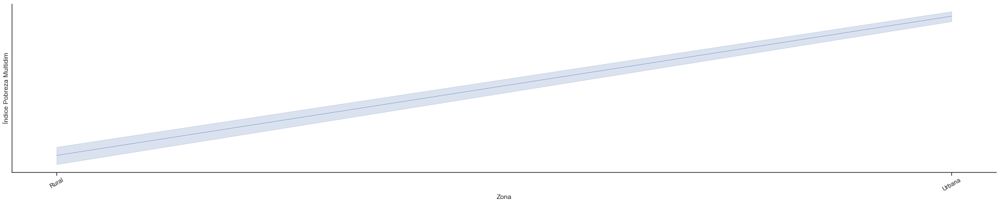

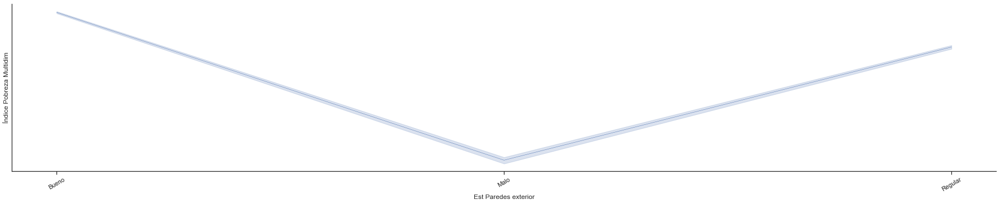

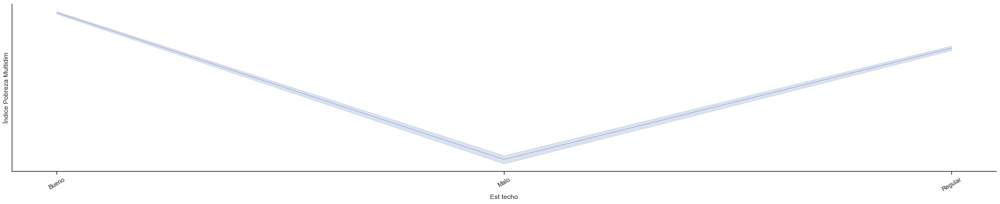

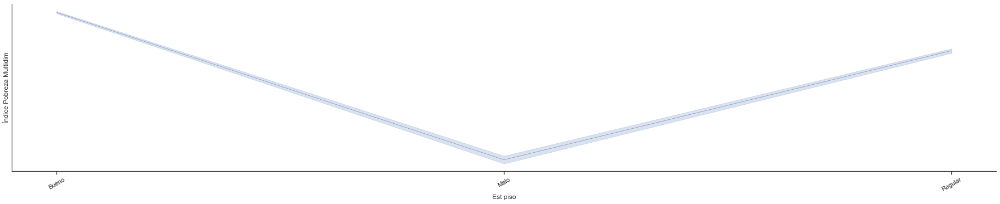

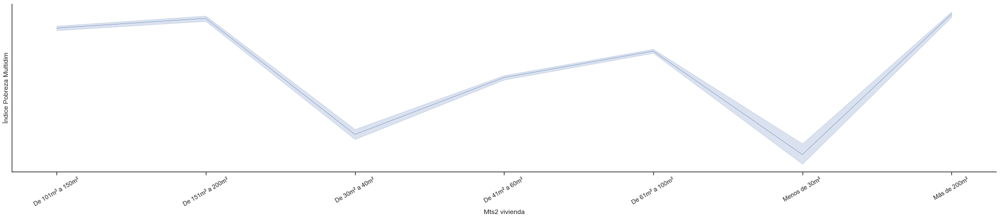

...

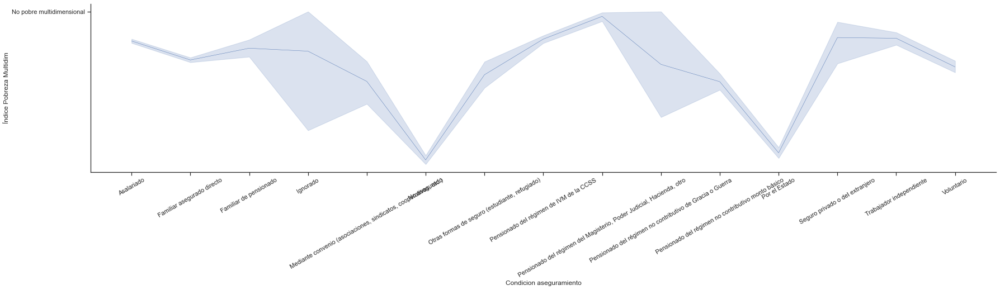

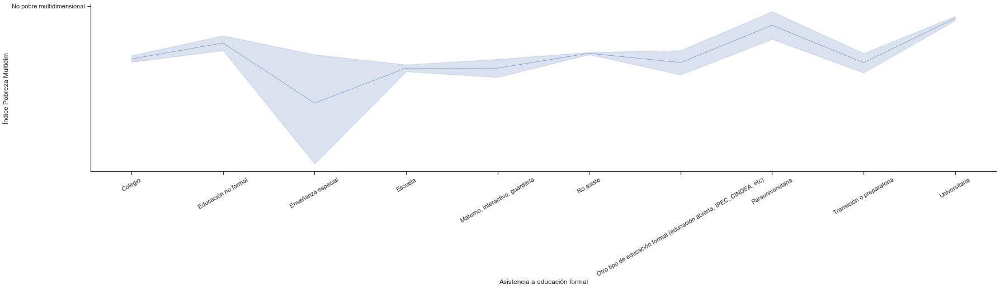

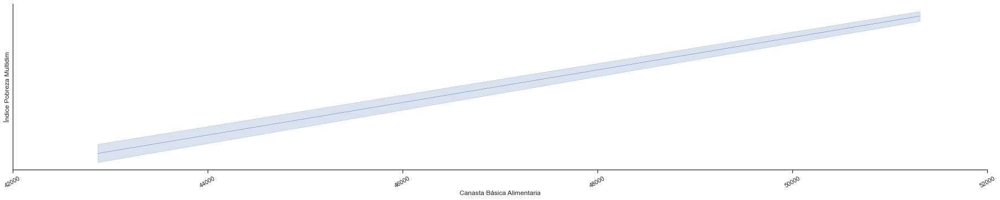

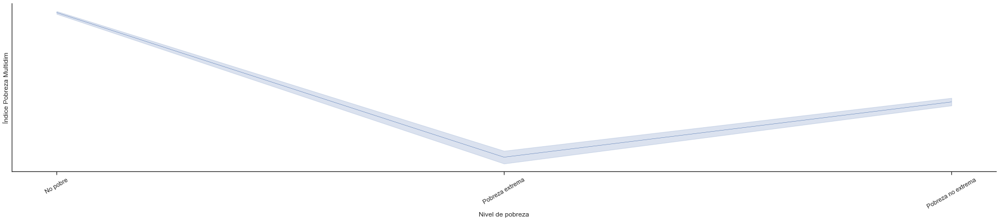

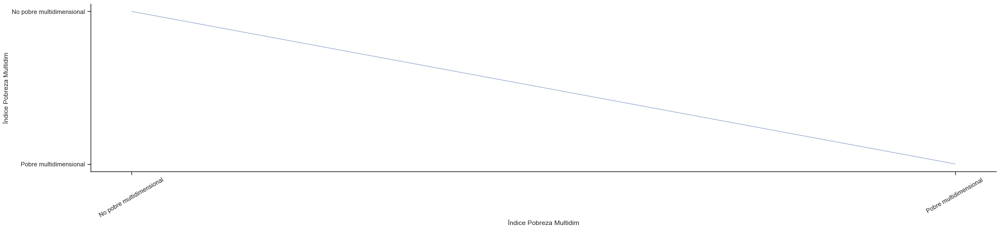

In [33]:
for i in df.columns.tolist():
    g = sns.relplot(y="Índice Pobreza Multidim", x=i, kind="line", data=df,height=5, aspect=5, linewidth=.5)
    g.set_xticklabels(rotation=30)

C:\Users\Jelb7\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


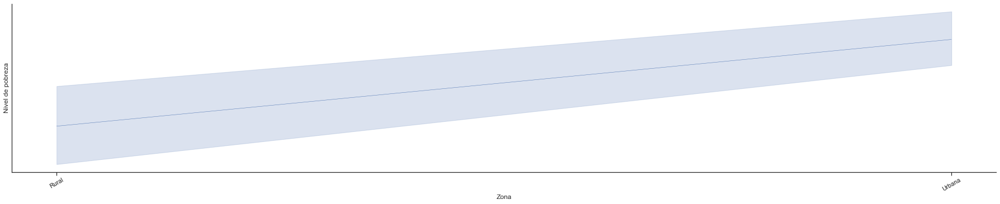

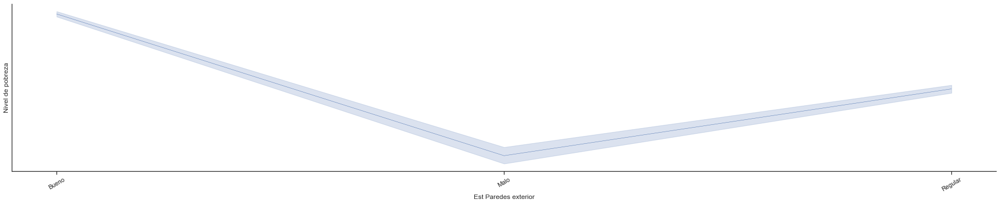

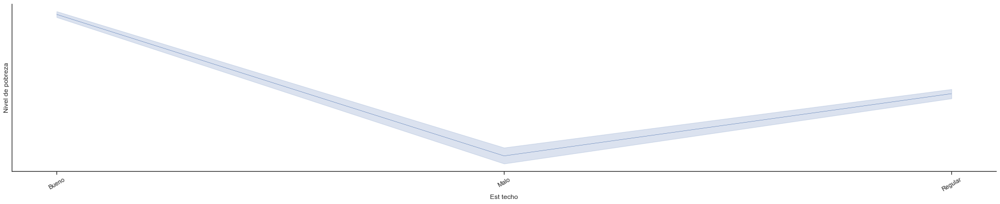

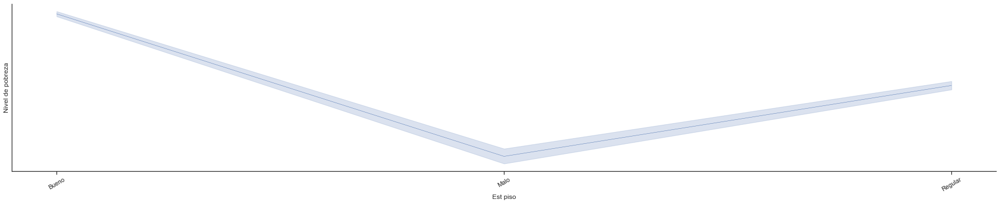

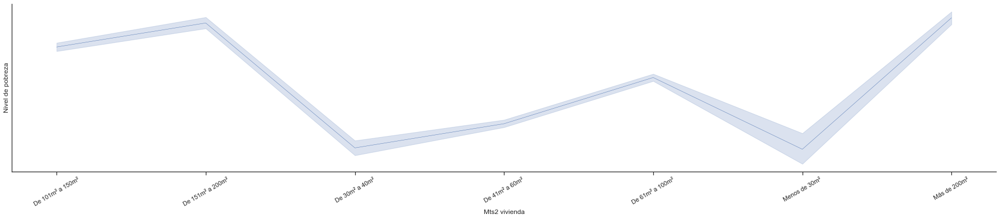

...

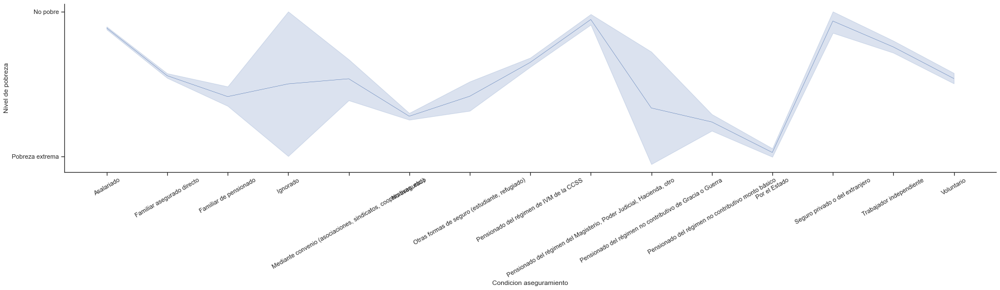

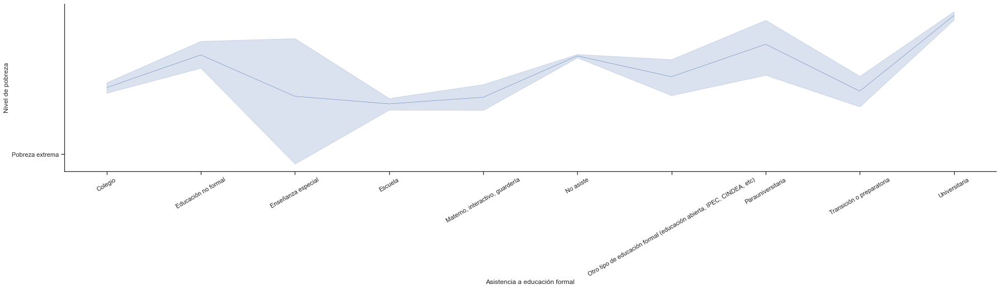

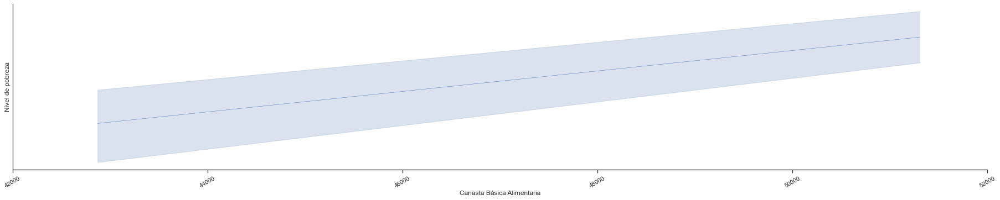

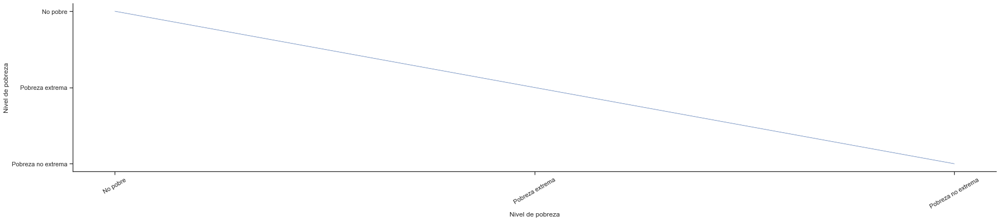

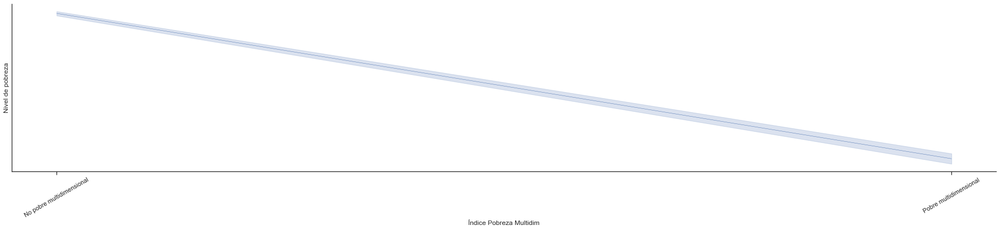

In [32]:
for i in df.columns.tolist():
    g = sns.relplot(y="Nivel de pobreza", x=i, kind="line", data=df,height=5, aspect=5, linewidth=.5)
    g.set_xticklabels(rotation=30)

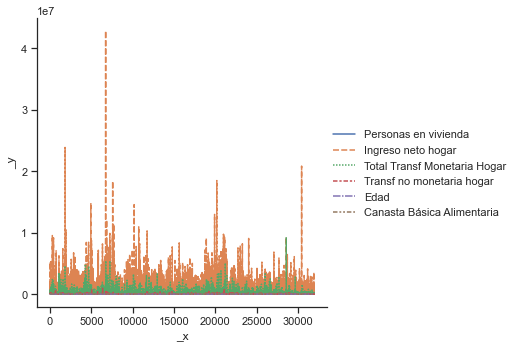

In [27]:
sns.relplot(data=df, kind="line")

C:\Users\Jelb7\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


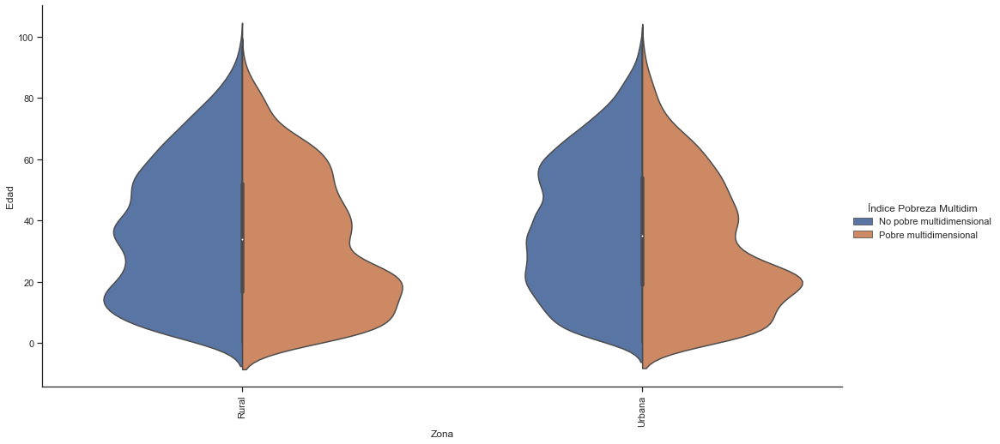

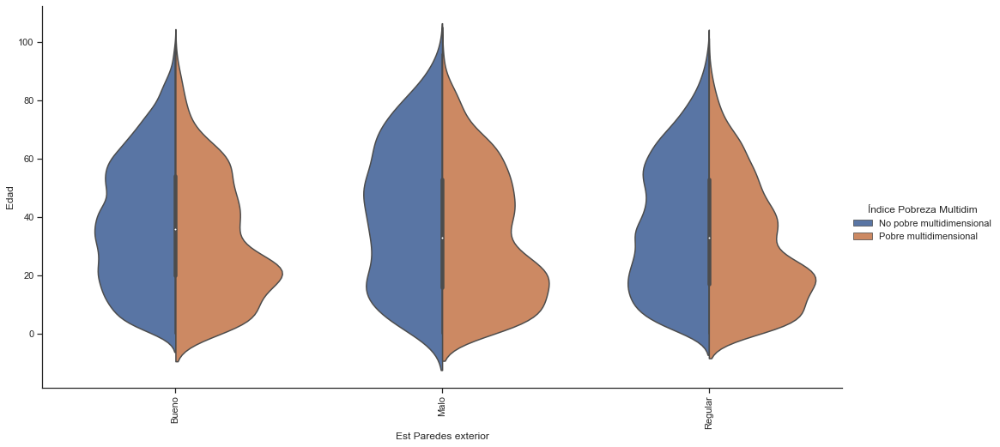

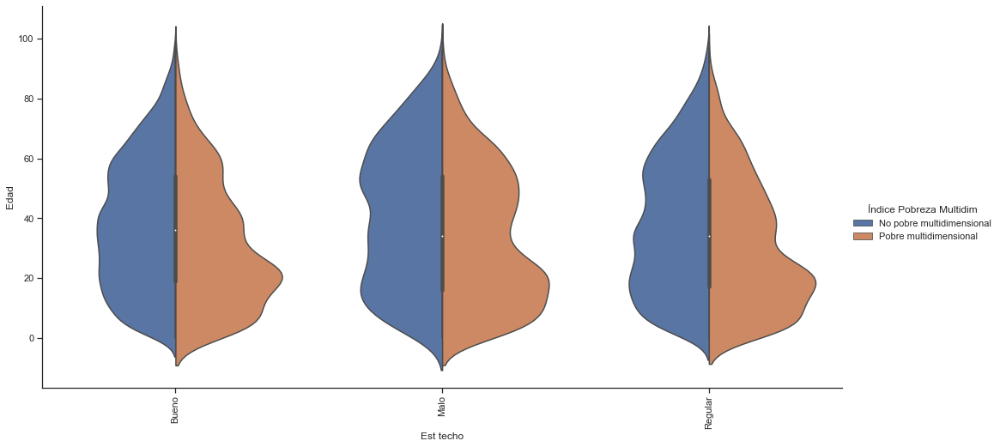

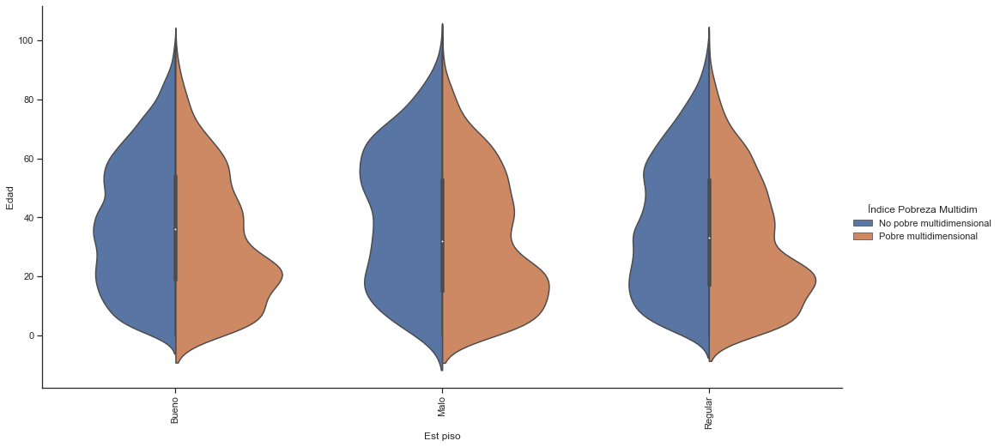

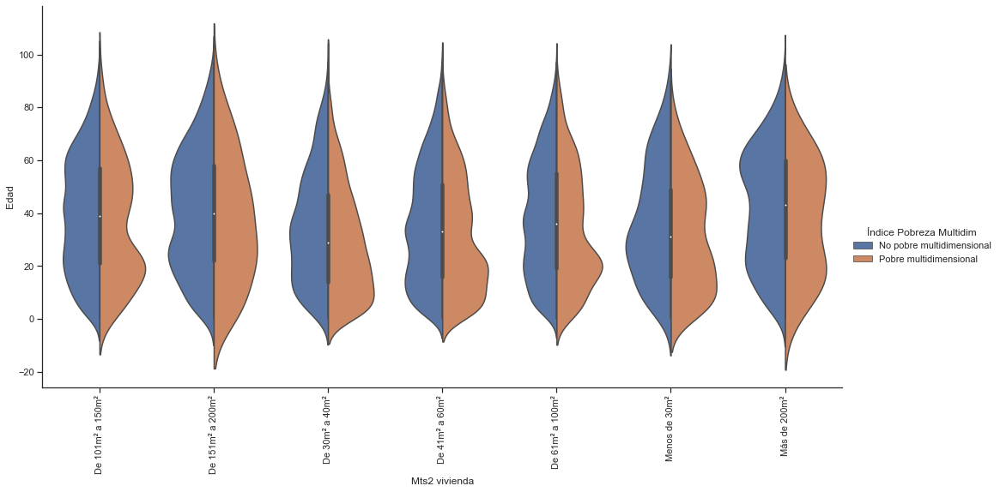

...

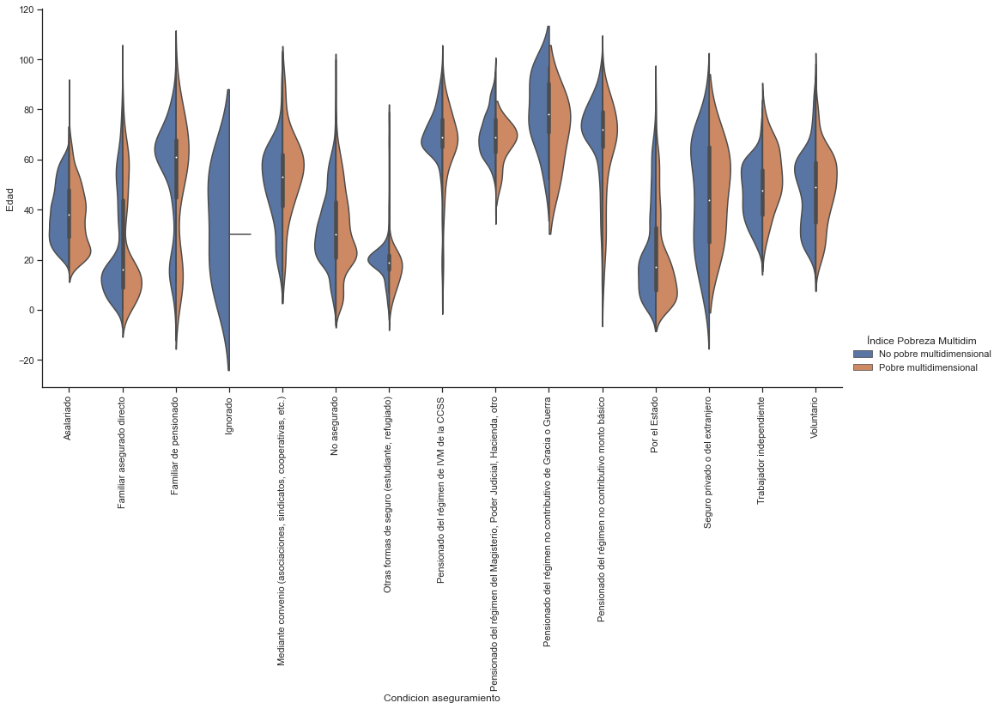

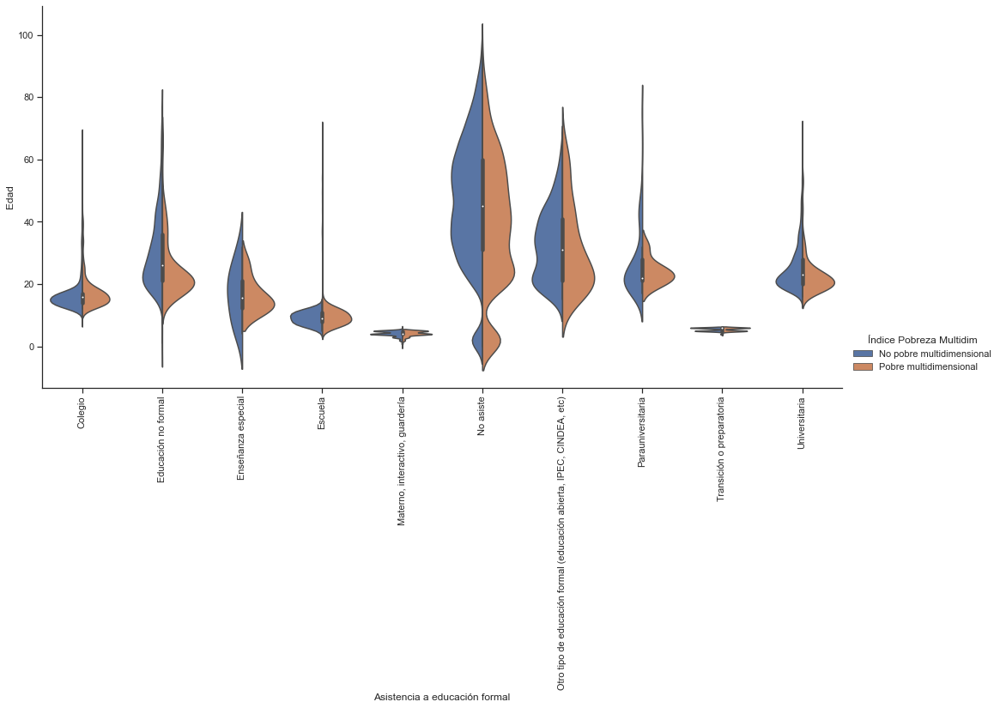

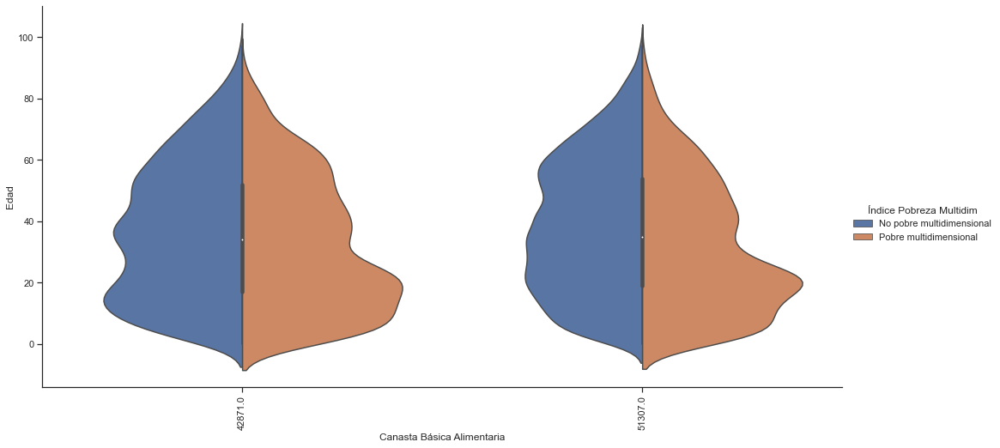

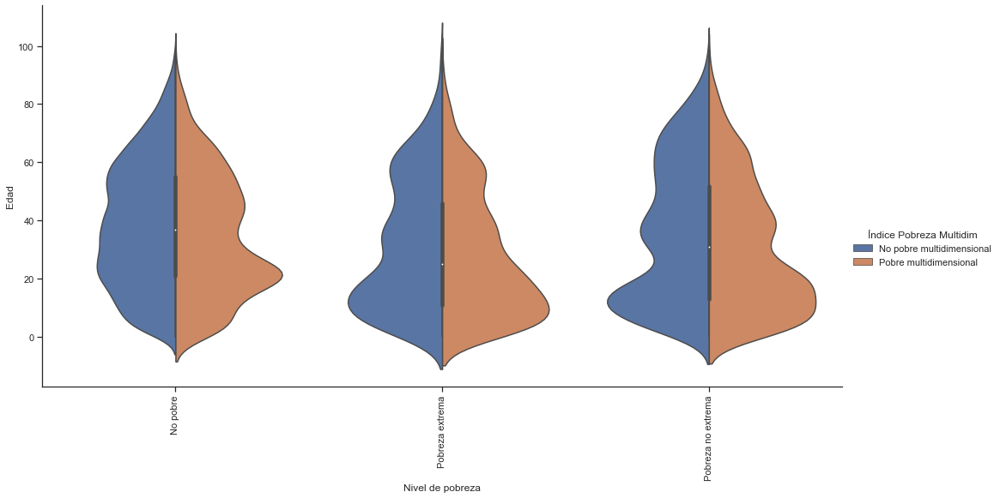

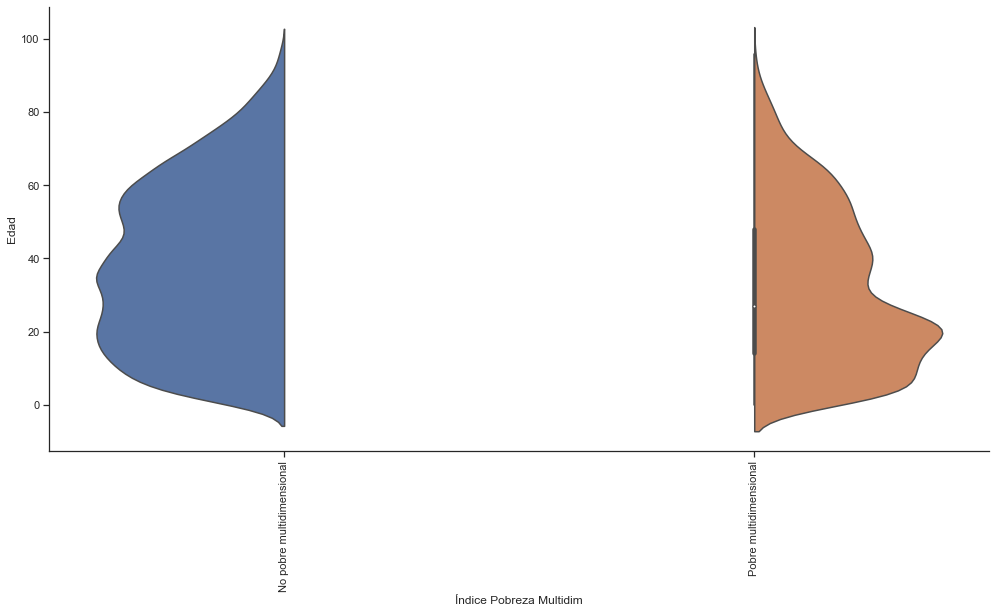

In [80]:
for i in df.columns.tolist():
    g = sns.catplot(x=i, y="Edad",
                    hue='Índice Pobreza Multidim', 
                    data=df, kind="violin", split=True,
                    height=7, aspect=2);
    g.set_xticklabels(rotation=90)                

C:\Users\Jelb7\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


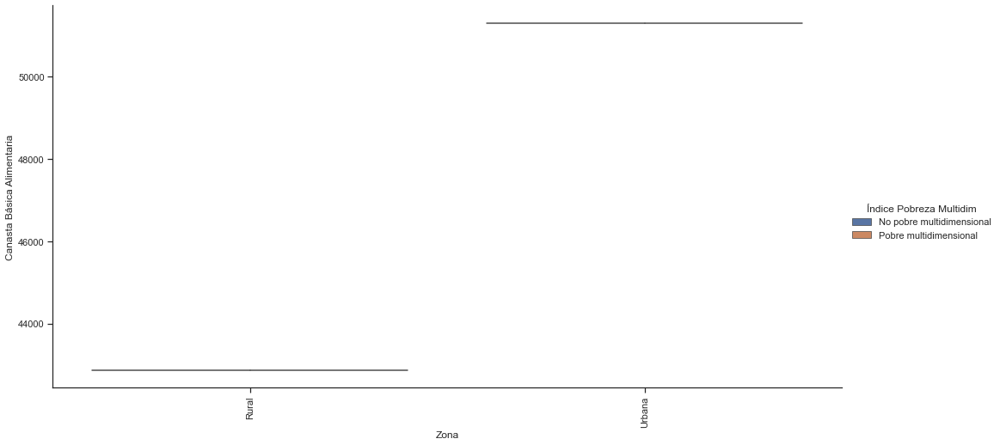

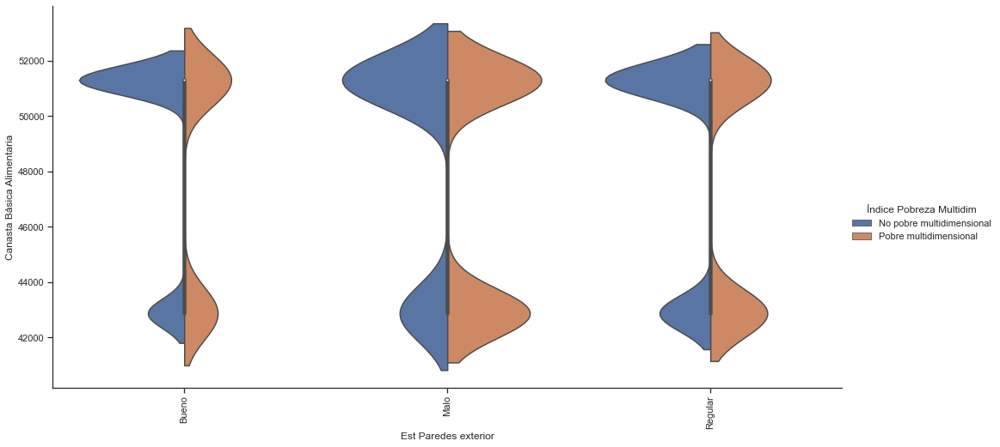

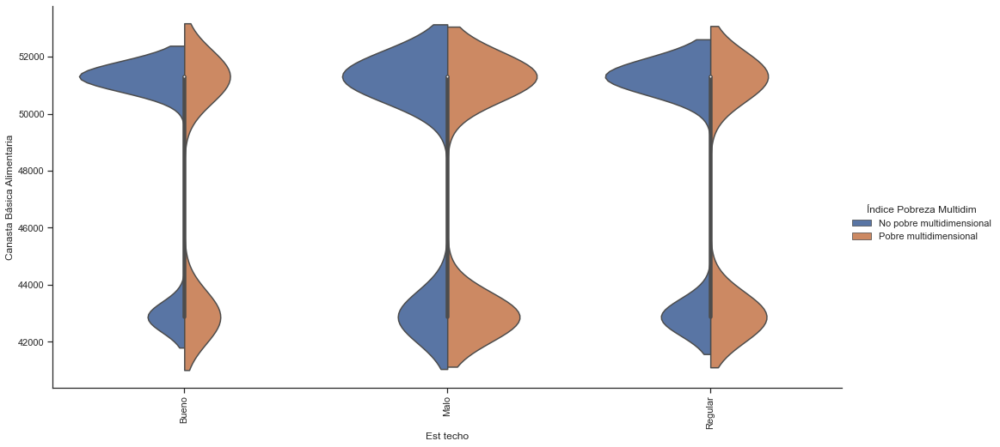

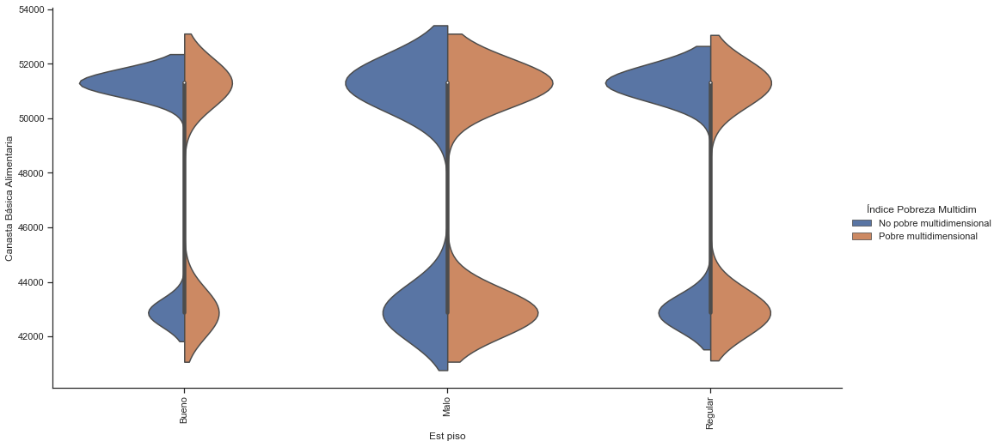

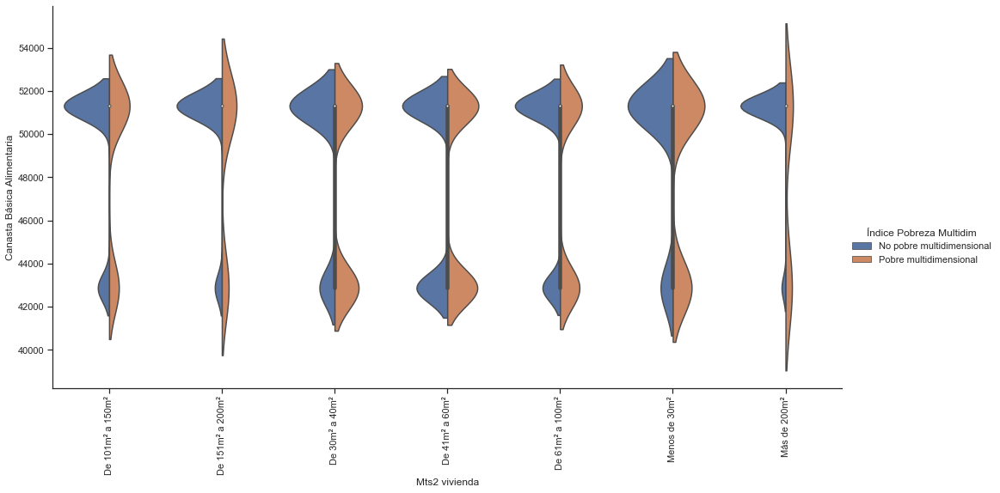

...

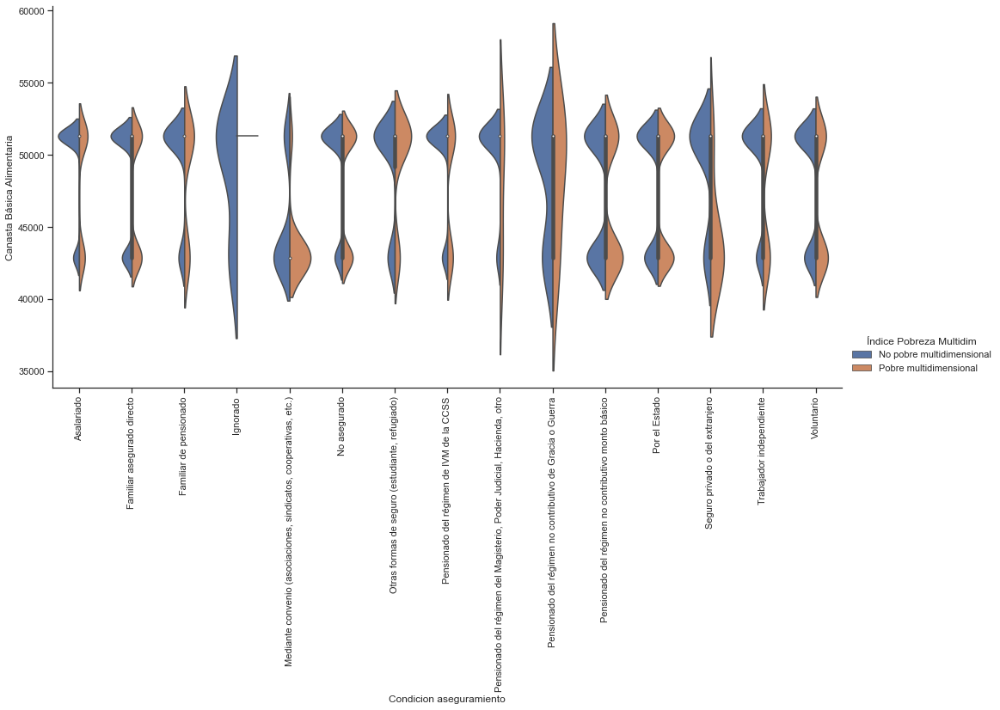

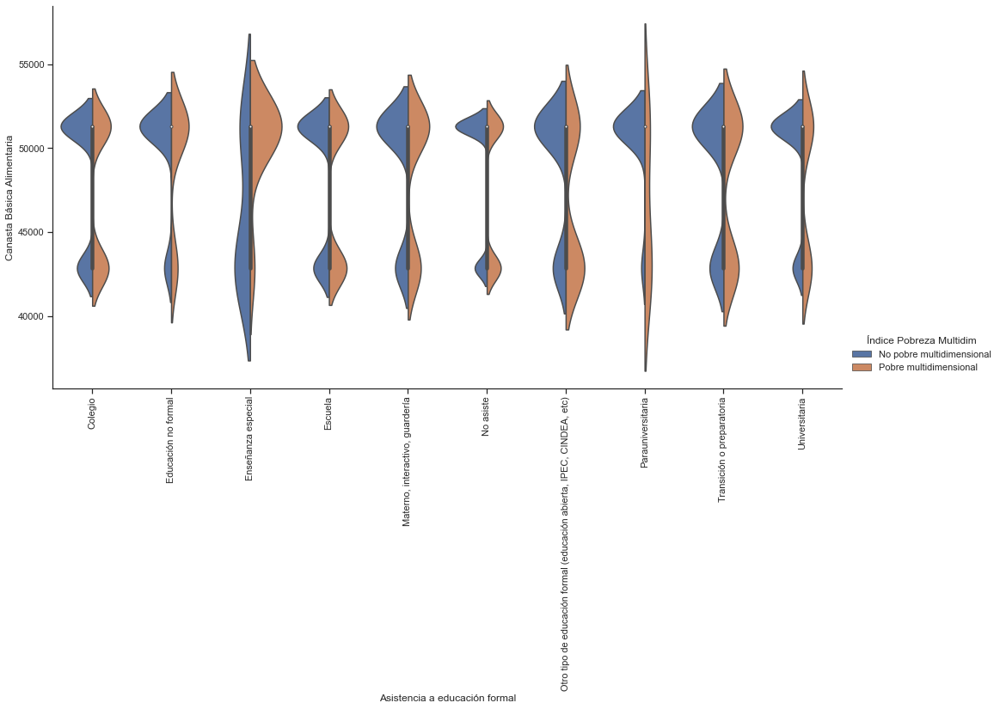

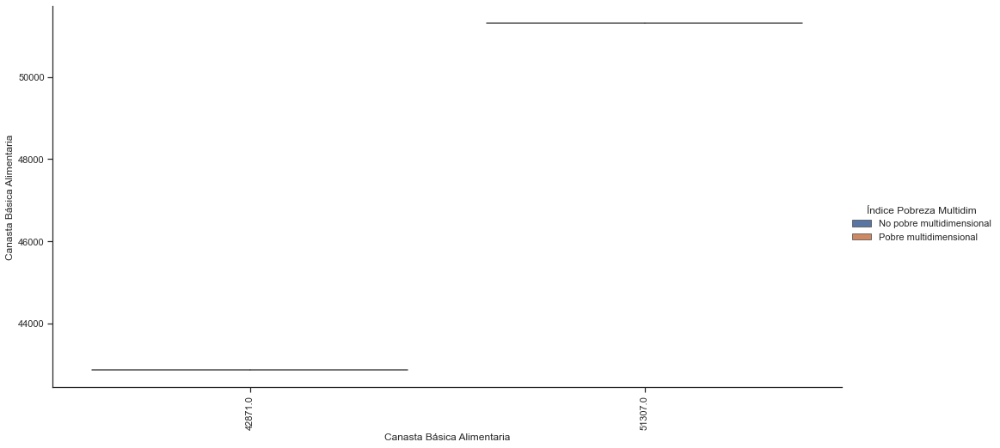

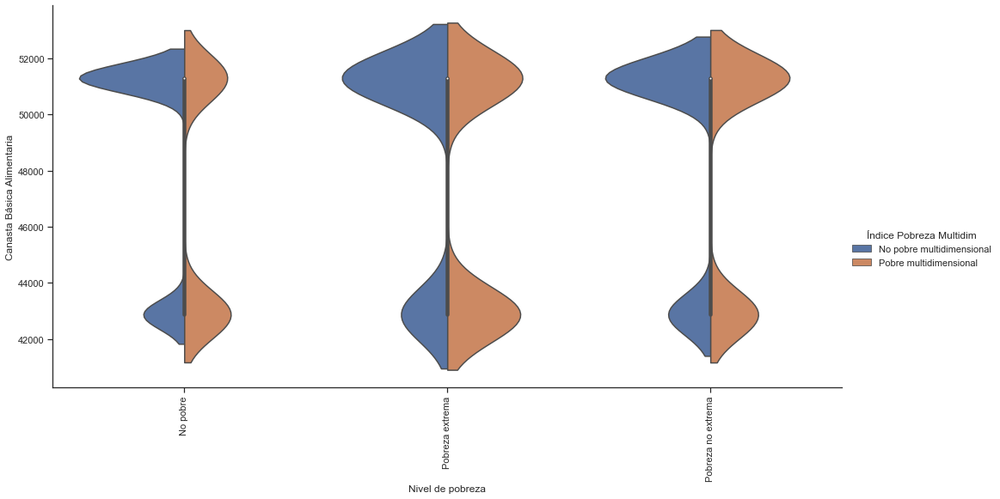

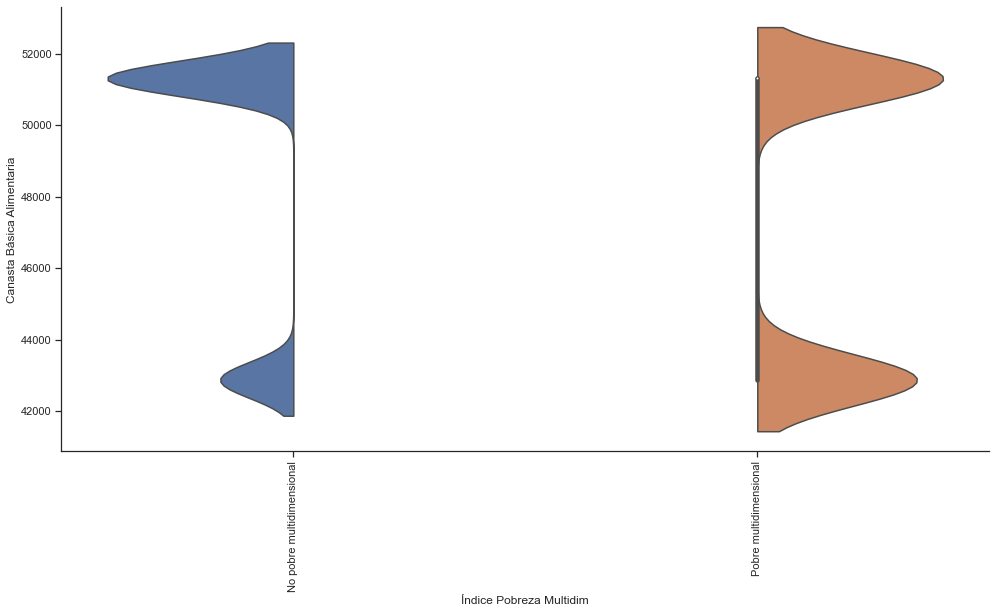

In [81]:
for i in df.columns.tolist():
    g = sns.catplot(x=i, y="Canasta Básica Alimentaria",
                    hue='Índice Pobreza Multidim', 
                    data=df, kind="violin", split=True,
                    height=7, aspect=2);
    g.set_xticklabels(rotation=90)            

C:\Users\Jelb7\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


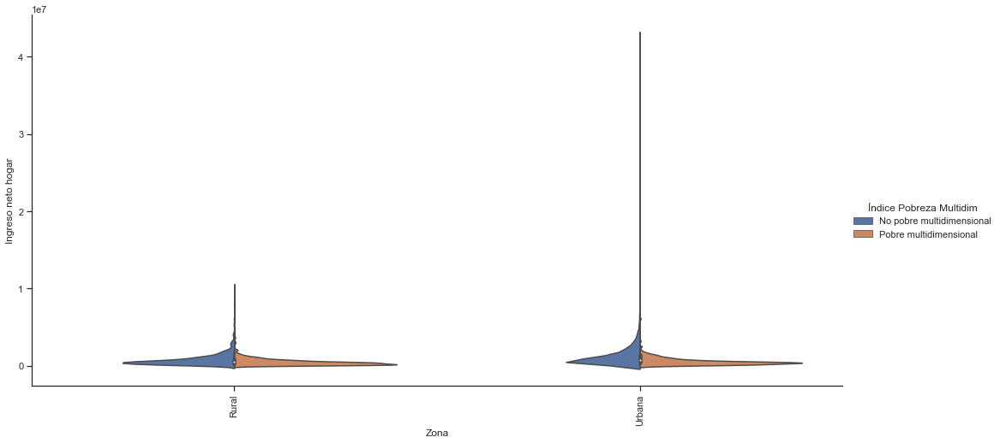

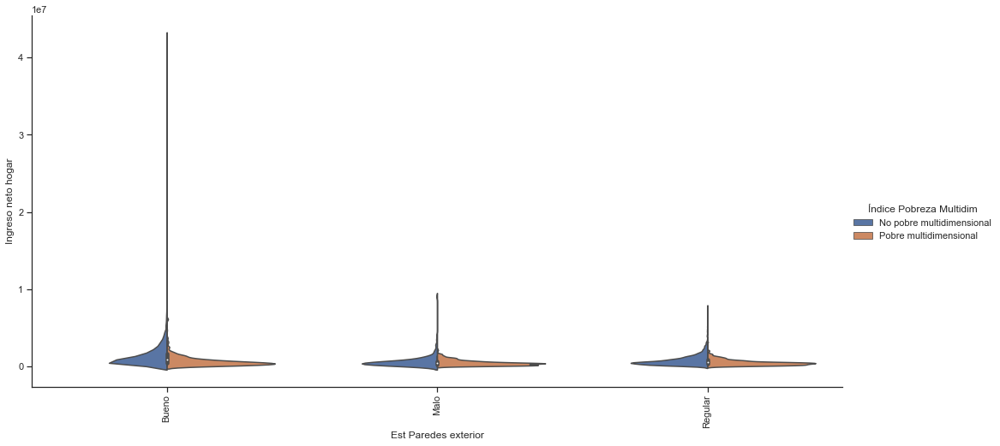

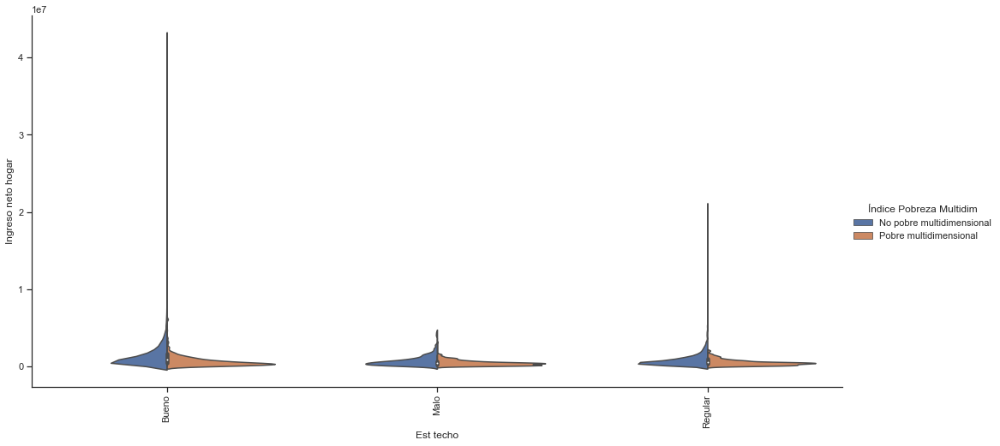

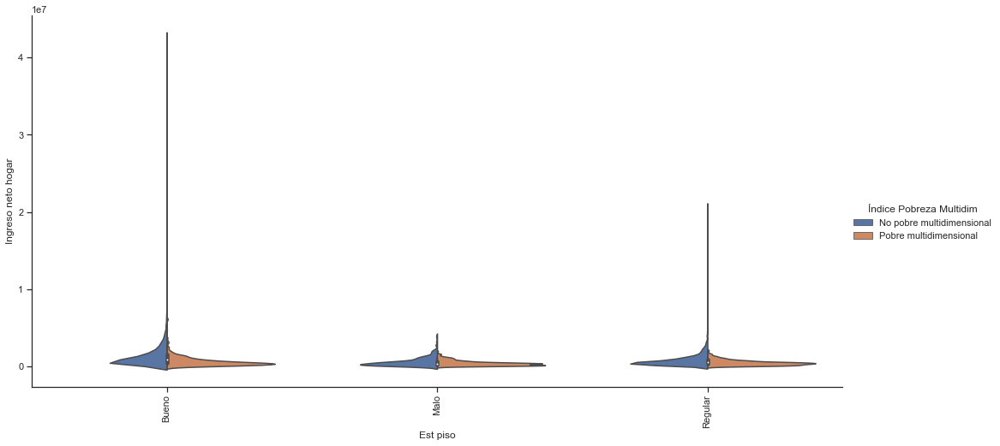

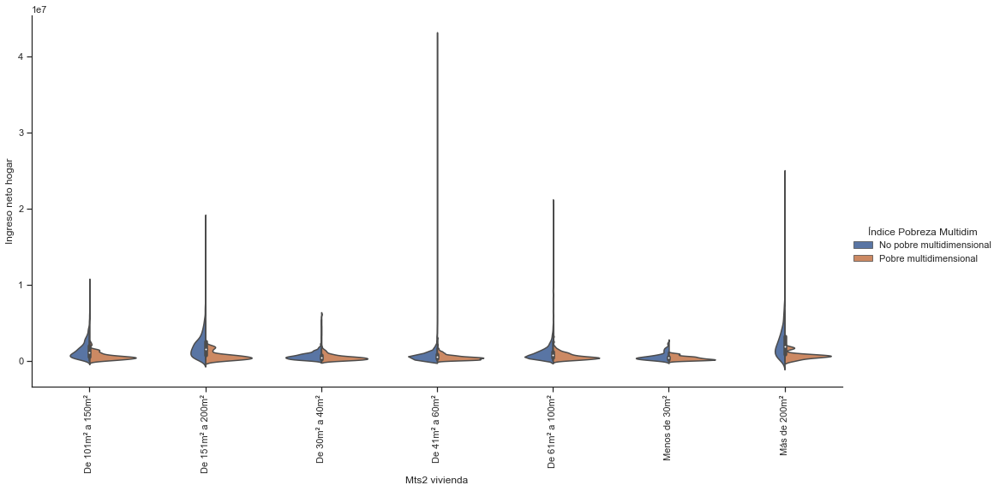

...

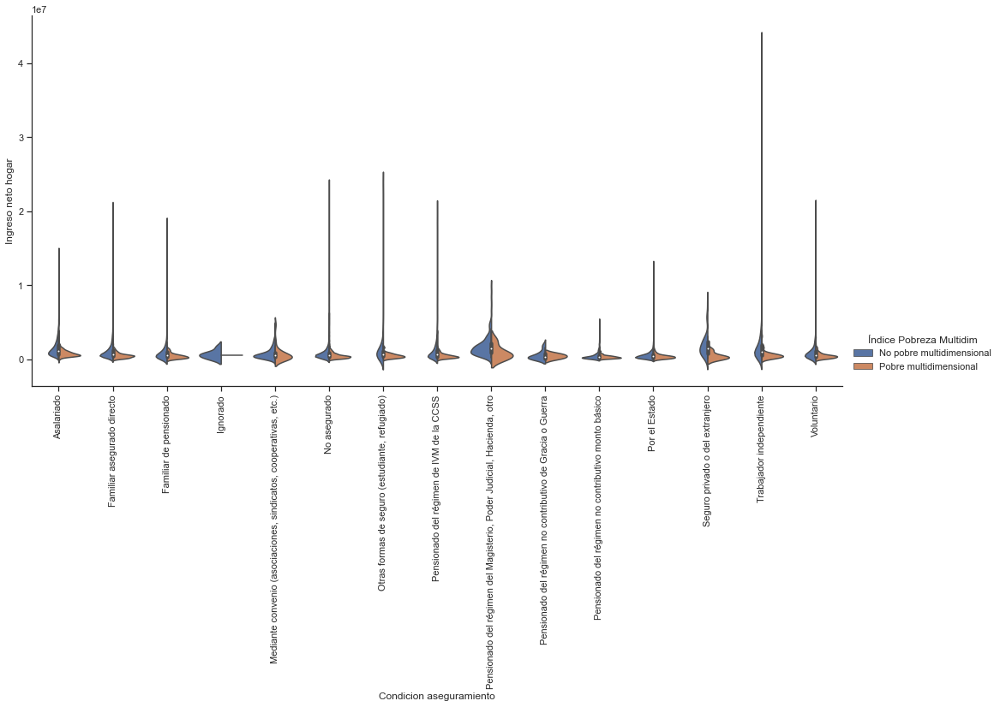

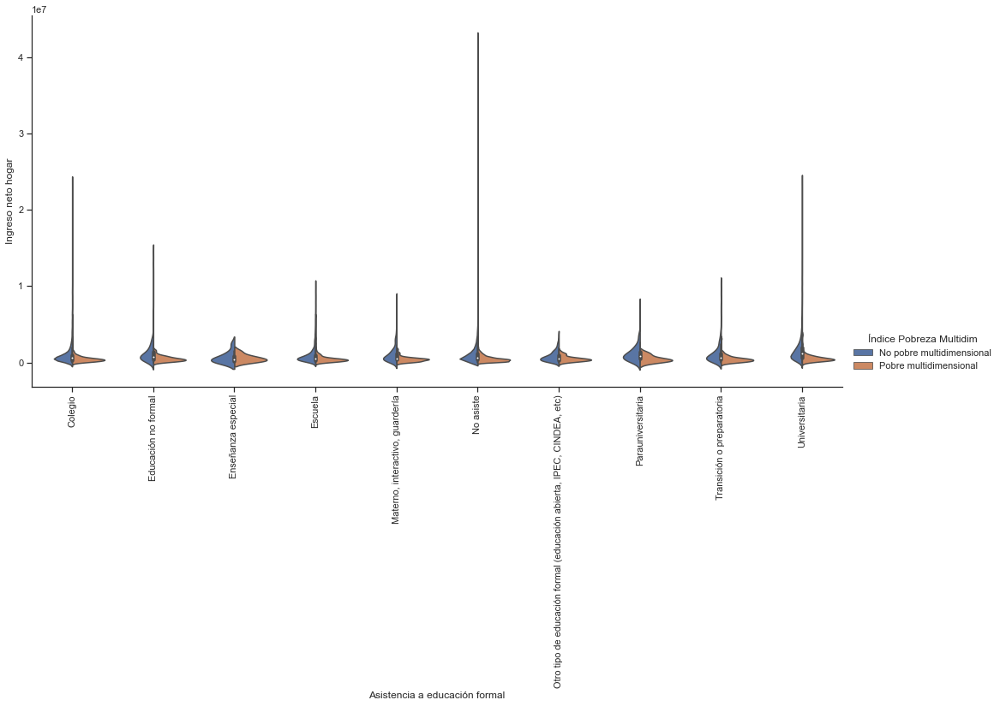

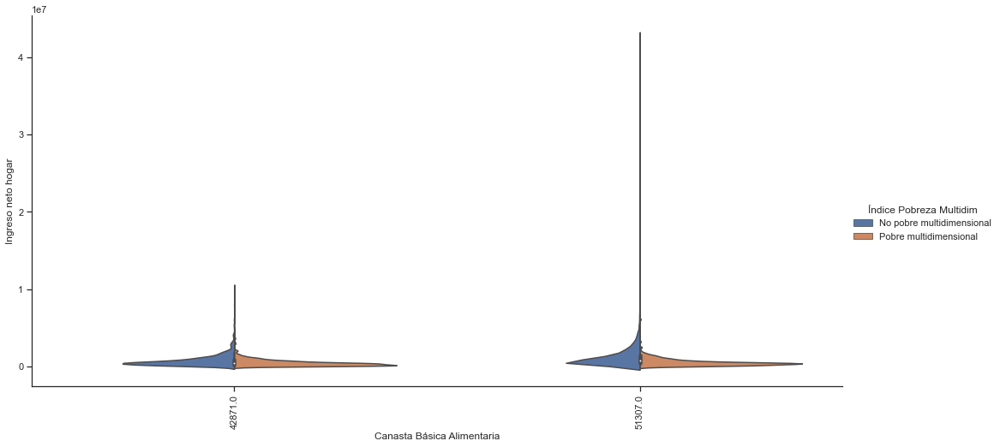

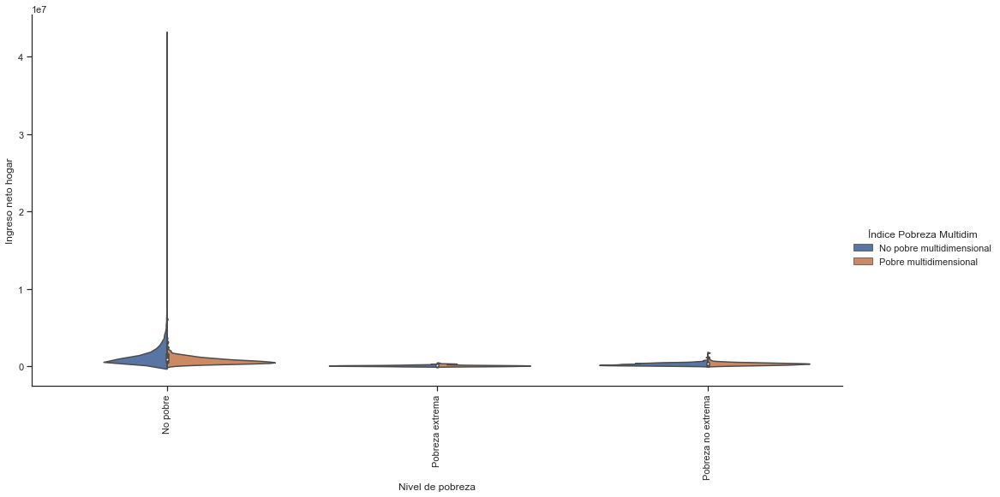

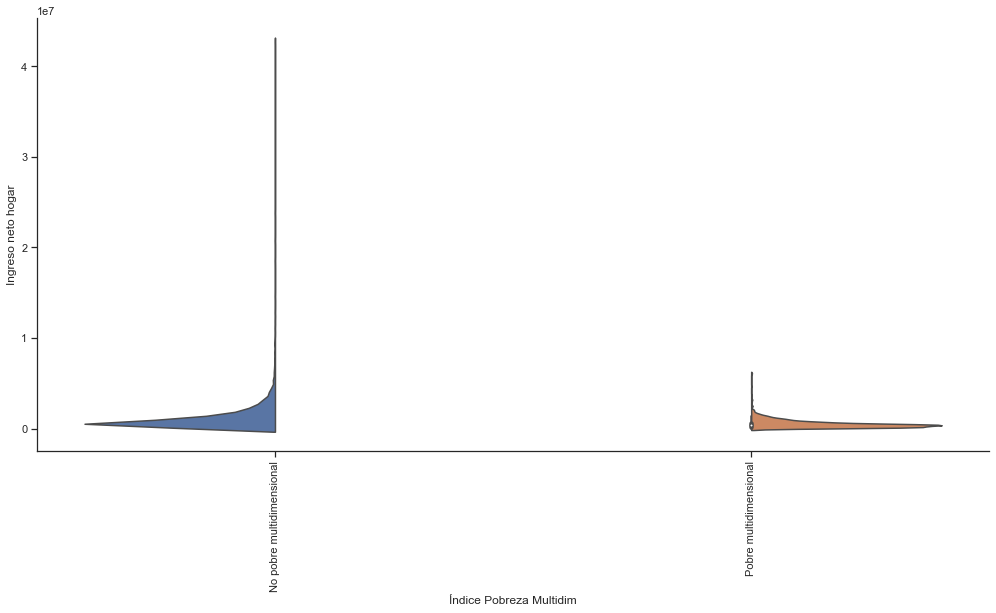

In [82]:
for i in df.columns.tolist():
    g = sns.catplot(x=i, y='Ingreso neto hogar',
                    hue='Índice Pobreza Multidim', 
                    data=df, kind="violin", split=True,
                    height=7, aspect=2);
    g.set_xticklabels(rotation=90)